# Tratamiento de imágenes - 2023 - Entregable 3

# Fecha de entrega: 04/6/2023

### Importante:   
**En todos los ejercicios se espera que se presente un breve contexto teórico y se  hagan comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en secciones agregadas al notebook o en un informe aparte agregado al notebook.**   

**El notebook entregado debe tener guardados los resultados de su ejecución.**

In [353]:
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread, imsave

# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ---------------- 
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook 
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
# %matplotlib widget
#---------------------------------------------------



# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
# 
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = 'imagenes'

dir_base_texturas = 'texturas'

## 1. Clasificación de texturas

Se usará la base de datos
G. Kylberg. The Kylberg Texture Dataset v. 1.0, Centre for Image Analysis,
Swedish University of Agricultural Sciences and Uppsala University,
External report (Blue series) No. 35.  
Disponible en: http://www.cb.uu.se/~gustaf/texture/  
Bajar la versión reducida de la base (6 clases, 40 muestras por clase, ~50 MB)

### 1.1 Calcular descriptores de textura


#### Calcular descriptores sobre el histograma de niveles de gris

In [354]:
def calcular_descriptores_de_histograma(I):
    '''
    Calcula el histograma normalizado de la imagen I.
    Devuelve descriptores sobre el histograma calculado
    
    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)

    Returns
    -------
    mean : double
    R : double
    skewness : double
    flatness : double
    uniformity : double
    entropy : double

    '''
    
    # calcular el histograma normalizado  
    numBins = 256
    histograma, bin_edges = np.histogram(I[:], np.arange(numBins+1), density=True)
       
    # COMPLETAR
    mean = np.mean(I)
    R = 1-1/(1+np.std(I)**2)
    
    z=np.arange(256)

    d = z - mean
    
    skewness = np.sum(d**3 * histograma) 
        
    flatness = np.sum(d**4 * histograma)

    uniformity = np.sum(histograma**2)

    entropy = -np.sum(histograma*np.log2(histograma+1e-6))

   
    return mean, R, skewness, flatness, uniformity, entropy

#### Calcular descriptores sobre la matriz de coocurrencia   
Para la implementación se usarán funciones adecuadas de   
https://scikit-image.org/docs/stable/api/skimage.feature.html

In [355]:
from skimage.feature import graycomatrix, graycoprops

def calcular_descriptores_de_matriz_de_coocurrencia(I, distance, angle, levels=256, debug=False):
    '''
    Calcula la matriz de coocurrencia NORMALIZADA para la imagen I 
    para la combinación (distancia, angulo) deseado  
    Devuelve descriptores sobre la matriz de coocurrencia calculada
    Se implementa con funciones adecuadas de: 
        skimage.feature
       
    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)
    distance : int, optional
        Distancia entre pixeles para calcular la coocurrencia.
    angle : double, optional
        Angulo (en radianes con respecto a la horizontal) para calcular la coocurrencia. 
    levels : int, optional . Por defecto 256.
        Usar solo para debuggear en imagenes artificiales pequeñas
    debug: bool, optional
        En caso de ser verdadero, imprime la matriz de coocurrencia 
    Returns
    -------
    contrast : double
    dissimilarity : double
    homogeneity : double
    energy : double
    correlation : double

    '''
    
    # COMPLETAR
    
    # Calcula la matriz de coocurrencia
    g = graycomatrix(I, [distance], [angle], levels=levels, symmetric=False,normed=True)

    # Calcula los descriptores
    contrast = graycoprops(g, 'contrast')[0, 0]
    dissimilarity = graycoprops(g, 'dissimilarity')[0, 0]
    
    homogeneity = 0
    for i in range(0,levels):
        for j in range(0,levels):
            homogeneity += g[i,j,0,0]/(1+ np.abs(i-j))
            
    energy = np.sum(g[:,:,0,0]**2)
    correlation = graycoprops(g, 'correlation')[0, 0]
    
    if debug:
        print('Matriz de coocurrencia: ')
        print(g[:,:,0,0])  # Imprime la matriz para el primer (y único) par de distancia/ángulo
    
    return contrast, dissimilarity, homogeneity, energy, correlation


Se utiliza la función graycomatrix para calcular la matriz de coocurrencia.  
Parámetros:  
-I: imágen de entrada.  
-distance: distancia entre pixeles para calcular la coocurrencia.  
-angle: ángulo en radianes con respecto a la horizontal para calcular la coocurrencia.  
-levels: número de niveles de gris en la imágen (típicamente 256).  
-symmetric: Si es True, se ignora el orden de las parejas encontradas (se suma 1 en las posiciones (i,j) y (j,i) cuando (i,j) es encontrado) generando una matriz simétrica.
-normed: Si es True, se normaliza la matriz de forma que la suma de todos sus elementos sea 1.

Para calcular algunos descriptores se utiliza la función graycoprops.  
Parámetros:  
-g: matriz de coocurrencia.  
-prop: el descriptor a calcular.  

Para otros descriptores se utiliza directamente la fórmula ya que la función greycoprops no utiliza la misma fórmula que el libro de Gonzalez & Woods

#### Chequear cálculo de descriptores sobre la matriz de coocurrencia
Chequear que la matriz de coocurrencia y los descriptores estén bien calculados sobre un caso sencillo con 4 niveles

In [356]:
image = np.array([[0, 0, 1, 1],
                  [0, 0, 1, 1],
                  [0, 2, 2, 2],
                  [2, 2, 3, 3]], dtype=np.uint8)

# chequear funcionamiento de la función para distancia 1 horizontal y distancia 1 vertical

#distancia 1 horizontal
contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 1, 0, levels=4, debug=True)

print('contrast: '+str(contrast))
print('dissimilarity: '+str(dissimilarity))
print('homogeneity: '+str(homogeneity))
print('energy: '+str(energy))
print('correlation: '+str(correlation))

#distancia 1 vertical
contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 1, np.pi/2, levels=4, debug=True)

print('contrast: '+str(contrast))
print('dissimilarity: '+str(dissimilarity))
print('homogeneity: '+str(homogeneity))
print('energy: '+str(energy))
print('correlation: '+str(correlation))

Matriz de coocurrencia: 
[[0.16666667 0.16666667 0.08333333 0.        ]
 [0.         0.16666667 0.         0.        ]
 [0.         0.         0.25       0.08333333]
 [0.         0.         0.         0.08333333]]
contrast: 0.5833333333333333
dissimilarity: 0.41666666666666663
homogeneity: 0.8194444444444444
energy: 0.16666666666666669
correlation: 0.7969884665638376
Matriz de coocurrencia: 
[[0.25       0.         0.16666667 0.        ]
 [0.         0.16666667 0.16666667 0.        ]
 [0.         0.         0.08333333 0.16666667]
 [0.         0.         0.         0.        ]]
contrast: 0.9999999999999999
dissimilarity: 0.6666666666666666
homogeneity: 0.7222222222222223
energy: 0.18055555555555555
correlation: 0.7011695914588866


La matriz de coocurrencia y los descriptores están bien calculados en ambos casos.

In [357]:
mean, R, skewness, flatness, uniformity, entropy = calcular_descriptores_de_histograma(image)

print('mean: '+str(mean))
print('R: '+str(R))
print('skewness: '+str(skewness))
print('flatness: '+str(flatness))
print('uniformity: '+str(uniformity))
print('entropy: '+str(entropy))

mean: 1.25
R: 0.5151515151515151
skewness: 0.1875
flatness: 2.03515625
uniformity: 0.2734375
entropy: 1.923789169928508


Los descriptores de histograma están bien calculados

#### Calcular descriptores de histograma y de matriz de coocurrencia sobre imágenes de la base de texturas.  Mostrar ejemplos para imágenes de las distintas clases

Para la matriz de coocurrencia puede ser conveniente explorar distintas distancias y ángulos


Descriptores de histograma:


,Imagen,Mean,R,Skewness,Flatness,Uniformity,Entropy
0,1,126.975848,0.999363,12408.466823,7.673618e+06,0.014468,6.332550
1,2,126.995678,0.999375,37201.198220,6.069690e+06,0.007868,7.173397
2,3,127.001637,0.999375,11142.358556,5.176687e+06,0.007022,7.253121
3,4,126.994912,0.999375,8663.386101,6.695598e+06,0.012498,6.497955
4,5,126.994493,0.999375,21793.944924,6.258288e+06,0.008281,7.056356
5,6,126.997043,0.999375,-3982.980755,6.540832e+06,0.009533,6.880653


Descriptores de matriz de coocurrencia, distancia 1, ángulo 0:


,Imagen,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,572.284037,18.792328,0.124251,0.000372,0.817677
1,2,91.041069,7.323847,0.225660,0.000274,0.971528
2,3,134.156643,7.223895,0.272167,0.000292,0.958043
3,4,154.580960,9.427524,0.205857,0.000553,0.951660
4,5,646.229719,19.913693,0.114763,0.000121,0.798033
5,6,192.348382,10.498714,0.186134,0.000293,0.939898


Descriptores de matriz de coocurrencia, distancia 2, ángulo 0:


,Imagen,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,1465.813196,30.378750,0.084838,0.000252,0.533010
1,2,255.657796,12.416821,0.157917,0.000167,0.919971
2,3,419.552991,13.143849,0.189491,0.000163,0.868795
3,4,512.160376,17.334622,0.133451,0.000310,0.839832
4,5,1328.031223,28.913796,0.084714,0.000090,0.584916
5,6,586.793472,18.542970,0.123722,0.000171,0.816664


Descriptores de matriz de coocurrencia, distancia 1, ángulo pi/4:


,Imagen,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,1107.505688,26.143577,0.096329,0.000283,0.647148
1,2,141.548845,9.225766,0.193229,0.000218,0.955729
2,3,182.913122,8.501635,0.250748,0.000248,0.942793
3,4,231.478851,11.658801,0.175718,0.000447,0.927593
4,5,818.161733,22.610187,0.102511,0.000108,0.744287
5,6,236.456012,11.747233,0.171230,0.000261,0.926137


Descriptores de matriz de coocurrencia, distancia 2, ángulo pi/2:


,Imagen,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,1598.241755,31.468575,0.083323,0.000247,0.490824
1,2,152.888257,9.547459,0.189356,0.000211,0.952229
2,3,291.642936,11.201177,0.206876,0.000182,0.908773
3,4,304.358416,13.637803,0.155278,0.000379,0.904766
4,5,1174.745445,27.303898,0.087899,0.000093,0.632835
5,6,404.548614,15.453189,0.140599,0.000202,0.873648


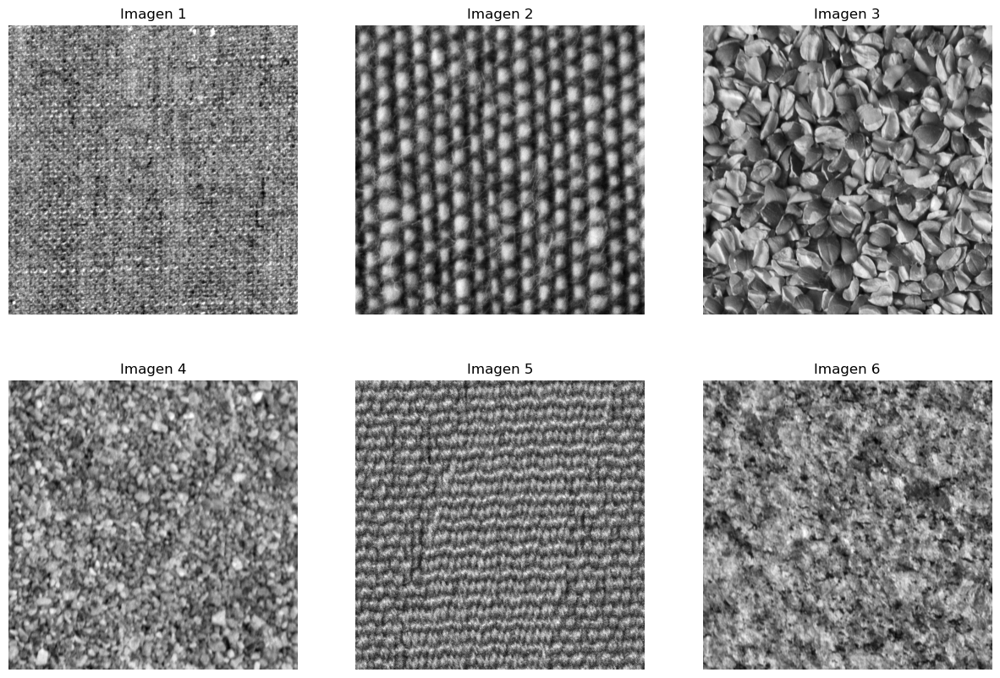

In [358]:
I1= imread(dir_base_texturas+'/canvas1/canvas1-a-p007.png')
I2= imread(dir_base_texturas+'/cushion1/cushion1-a-p006.png')
I3= imread(dir_base_texturas+'/linsseeds1/linseeds1-a-p004.png')
I4= imread(dir_base_texturas+'/sand1/sand1-a-p005.png')
I5= imread(dir_base_texturas+'/seat2/seat2-a-p020.png')
I6= imread(dir_base_texturas+'/stone1/stone1-a-p026.png')

fig, ax = plt.subplots(2,3, figsize=(15,10))
ax[0,0].imshow(I1, cmap='gray')
ax[0,1].imshow(I2, cmap='gray')
ax[0,2].imshow(I3, cmap='gray')
ax[1,0].imshow(I4, cmap='gray')
ax[1,1].imshow(I5, cmap='gray')
ax[1,2].imshow(I6, cmap='gray')
ax[0,0].set_title('Imagen 1')
ax[0,1].set_title('Imagen 2')
ax[0,2].set_title('Imagen 3')
ax[1,0].set_title('Imagen 4')
ax[1,1].set_title('Imagen 5')
ax[1,2].set_title('Imagen 6')
ax[0,0].axis('Off')
ax[0,1].axis('Off')
ax[0,2].axis('Off')
ax[1,0].axis('Off')
ax[1,1].axis('Off')
ax[1,2].axis('Off')

import pandas as pd

mean_l=[]
R_l=[]
skewness_l=[]
flatness_l=[]
uniformity_l=[]
entropy_l=[]

for image in [I1, I2, I3, I4, I5, I6]:
    mean, R, skewness, flatness, uniformity, entropy = calcular_descriptores_de_histograma(image)
    mean_l.append(mean)
    R_l.append(R)
    skewness_l.append(skewness)
    flatness_l.append(flatness)
    uniformity_l.append(uniformity)
    entropy_l.append(entropy)
   
descriptores_hist={'Imagen': [1, 2, 3, 4, 5, 6], 'Mean':mean_l, 'R':R_l, 'Skewness':skewness_l, 'Flatness':flatness_l, 'Uniformity':uniformity_l, 'Entropy':entropy_l}

df_hist=pd.DataFrame(descriptores_hist)
print('Descriptores de histograma:')
display(df_hist)

contrast_l=[]
dissimilarity_l=[]
homogeneity_l=[]
energy_l=[]
correlation_l=[]

for image in [I1, I2, I3, I4, I5, I6]:
    contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 1, 0)
    contrast_l.append(contrast)
    dissimilarity_l.append(dissimilarity)
    homogeneity_l.append(homogeneity)
    energy_l.append(energy)
    correlation_l.append(correlation)
   
descriptores_matriz1={'Imagen': [1, 2, 3, 4, 5, 6], 'Contrast':contrast_l, 'Dissimilarity':dissimilarity_l, 'Homogeneity':homogeneity_l, 'Energy':energy_l, 'Correlation':correlation_l}

df_matriz1=pd.DataFrame(descriptores_matriz1)
print('Descriptores de matriz de coocurrencia, distancia 1, ángulo 0:')
display(df_matriz1)

contrast_l=[]
dissimilarity_l=[]
homogeneity_l=[]
energy_l=[]
correlation_l=[]

for image in [I1, I2, I3, I4, I5, I6]:
    contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 2, 0)
    contrast_l.append(contrast)
    dissimilarity_l.append(dissimilarity)
    homogeneity_l.append(homogeneity)
    energy_l.append(energy)
    correlation_l.append(correlation)
   
descriptores_matriz2={'Imagen': [1, 2, 3, 4, 5, 6], 'Contrast':contrast_l, 'Dissimilarity':dissimilarity_l, 'Homogeneity':homogeneity_l, 'Energy':energy_l, 'Correlation':correlation_l}

df_matriz2=pd.DataFrame(descriptores_matriz2)
print('Descriptores de matriz de coocurrencia, distancia 2, ángulo 0:')
display(df_matriz2)

contrast_l=[]
dissimilarity_l=[]
homogeneity_l=[]
energy_l=[]
correlation_l=[]

for image in [I1, I2, I3, I4, I5, I6]:
    contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 1, np.pi/4)
    contrast_l.append(contrast)
    dissimilarity_l.append(dissimilarity)
    homogeneity_l.append(homogeneity)
    energy_l.append(energy)
    correlation_l.append(correlation)
   
descriptores_matriz3={'Imagen': [1, 2, 3, 4, 5, 6], 'Contrast':contrast_l, 'Dissimilarity':dissimilarity_l, 'Homogeneity':homogeneity_l, 'Energy':energy_l, 'Correlation':correlation_l}

df_matriz3=pd.DataFrame(descriptores_matriz3)
print('Descriptores de matriz de coocurrencia, distancia 1, ángulo pi/4:')
display(df_matriz3)

contrast_l=[]
dissimilarity_l=[]
homogeneity_l=[]
energy_l=[]
correlation_l=[]

for image in [I1, I2, I3, I4, I5, I6]:
    contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(image, 2, np.pi/2)
    contrast_l.append(contrast)
    dissimilarity_l.append(dissimilarity)
    homogeneity_l.append(homogeneity)
    energy_l.append(energy)
    correlation_l.append(correlation)
   
descriptores_matriz4={'Imagen': [1, 2, 3, 4, 5, 6], 'Contrast':contrast_l, 'Dissimilarity':dissimilarity_l, 'Homogeneity':homogeneity_l, 'Energy':energy_l, 'Correlation':correlation_l}

df_matriz4=pd.DataFrame(descriptores_matriz4)
print('Descriptores de matriz de coocurrencia, distancia 2, ángulo pi/2:')
display(df_matriz4)

### 1.2. Ver si algunos de los descriptores calculados permiten discriminar las texturas


#### Analizar gráficamente:  Considerar pares de descriptores. Graficar los valores para las imágenes de la base y ver si se separan las clases. 
Puede ser conveniente para esto explorar:  https://seaborn.pydata.org/generated/seaborn.pairplot.html


In [359]:
foldernames=os.listdir(dir_base_texturas)

print(foldernames)
textura_l=[]
mean_l=[]
R_l=[]
skewness_l=[]
flatness_l=[]
uniformity_l=[]
entropy_l=[]
contrast_l=[]
dissimilarity_l=[]
homogeneity_l=[]
energy_l=[]
correlation_l=[]

for foldername in foldernames:
    folder_directory = os.path.join(dir_base_texturas, foldername)
    filenames=os.listdir(folder_directory)
    for filename in filenames:
        image_directory=os.path.join(folder_directory, filename)
        I=imread(image_directory)
        textura_l.append(foldername)
        mean, R, skewness, flatness, uniformity, entropy = calcular_descriptores_de_histograma(I)
        mean_l.append(mean)
        R_l.append(R)
        skewness_l.append(skewness)
        flatness_l.append(flatness)
        uniformity_l.append(uniformity)
        entropy_l.append(entropy)
        contrast, dissimilarity, homogeneity, energy, correlation = calcular_descriptores_de_matriz_de_coocurrencia(I, 2, 0)
        contrast_l.append(contrast)
        dissimilarity_l.append(dissimilarity)
        homogeneity_l.append(homogeneity)
        energy_l.append(energy)
        correlation_l.append(correlation)
        
descriptores={'Textura':textura_l, 'Mean':mean_l, 'R':R_l, 'Skewness':skewness_l, 'Flatness':flatness_l, 'Uniformity':uniformity_l, 'Entropy':entropy_l, 'Contrast':contrast_l, 'Dissimilarity':dissimilarity_l, 'Homogeneity':homogeneity_l, 'Energy':energy_l, 'Correlation':correlation_l}

df_descriptores=pd.DataFrame(descriptores)

display(df_descriptores)


['canvas1', 'cushion1', 'linsseeds1', 'sand1', 'seat2', 'stone1']


,Textura,Mean,R,Skewness,Flatness,Uniformity,Entropy,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,canvas1,126.920751,0.999366,14566.177051,7.593003e+06,0.019388,5.905386,1358.445182,29.199108,0.091767,0.000463,0.568863
1,canvas1,126.928449,0.999367,13416.958116,7.638650e+06,0.018184,5.999657,1432.171467,29.933365,0.089134,0.000402,0.546417
2,canvas1,126.942440,0.999369,13053.351527,7.597473e+06,0.016705,6.122038,1411.470680,29.812573,0.087889,0.000340,0.554448
3,canvas1,126.897349,0.999366,11655.699817,7.716541e+06,0.016429,6.152262,1527.064632,30.975697,0.085411,0.000320,0.515866
4,canvas1,126.942112,0.999369,11342.517655,7.741418e+06,0.015335,6.251706,1449.704474,30.254204,0.085357,0.000284,0.542215
...,...,...,...,...,...,...,...,...,...,...,...,...
235,stone1,126.978009,0.999375,1027.269432,6.528972e+06,0.009345,6.909053,635.576498,19.304618,0.120505,0.000159,0.801288
236,stone1,127.003319,0.999376,-3125.427080,6.475797e+06,0.009004,6.959018,591.289746,18.618857,0.123139,0.000153,0.815335
237,stone1,126.999659,0.999375,-3160.272318,6.572822e+06,0.009287,6.920253,526.161017,17.587229,0.127988,0.000171,0.835646
238,stone1,126.996296,0.999376,-4711.777707,6.459478e+06,0.009382,6.898071,434.870366,16.069680,0.135829,0.000188,0.864092


Se calculan los descriptores de histograma y descriptores de matriz de coocurrencia de distancia 2 y ángulo 0 para todas las imágenes.

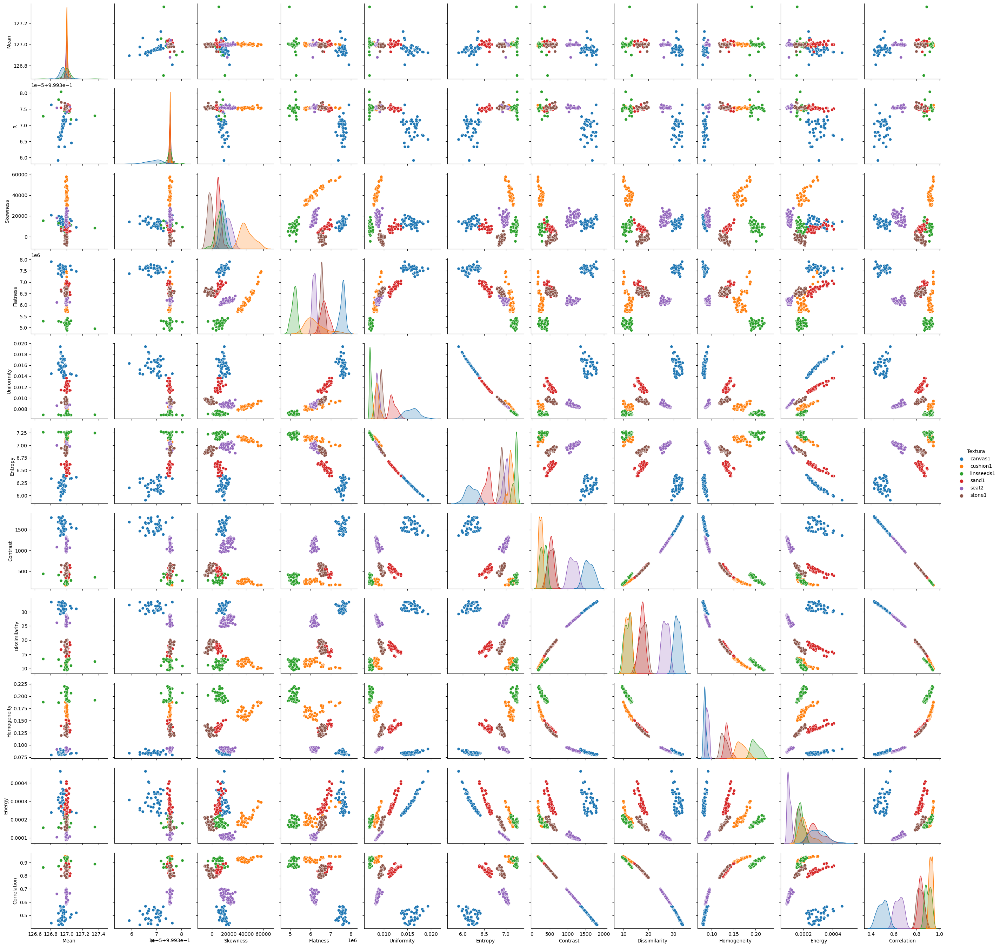

In [360]:
import seaborn as sns

sns.pairplot(data=df_descriptores, hue='Textura')

####  ¿Existen descriptores que permiten discriminar las texturas de la base? En caso afirmativo, muestre cuáles se podrían usar. 

Si se considera un único descriptor, el que permitiría discriminar las texturas de mejor forma sería la homogeneidad, que parece ser el descriptor para el cual los histogramas de cada textura tienen menor superposición de área.

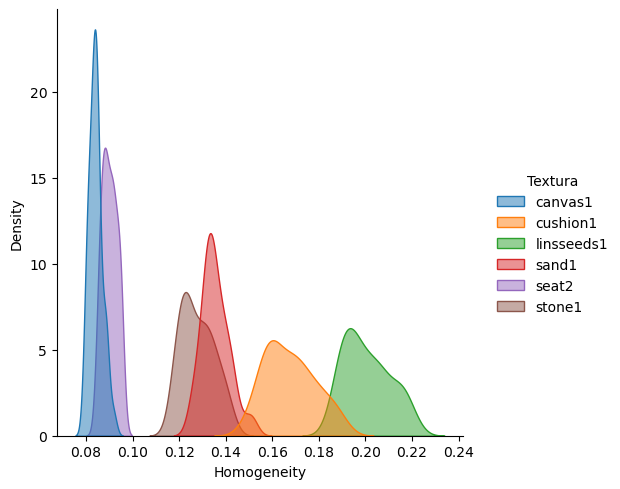

In [361]:
sns.displot(data=df_descriptores, x='Homogeneity', hue='Textura', kind='kde', fill=True, alpha=0.5)

Los siguientes pares de descriptores son los que permiten discriminar las texturas de la base más claramente:

<Axes: xlabel='Uniformity', ylabel='Correlation'>

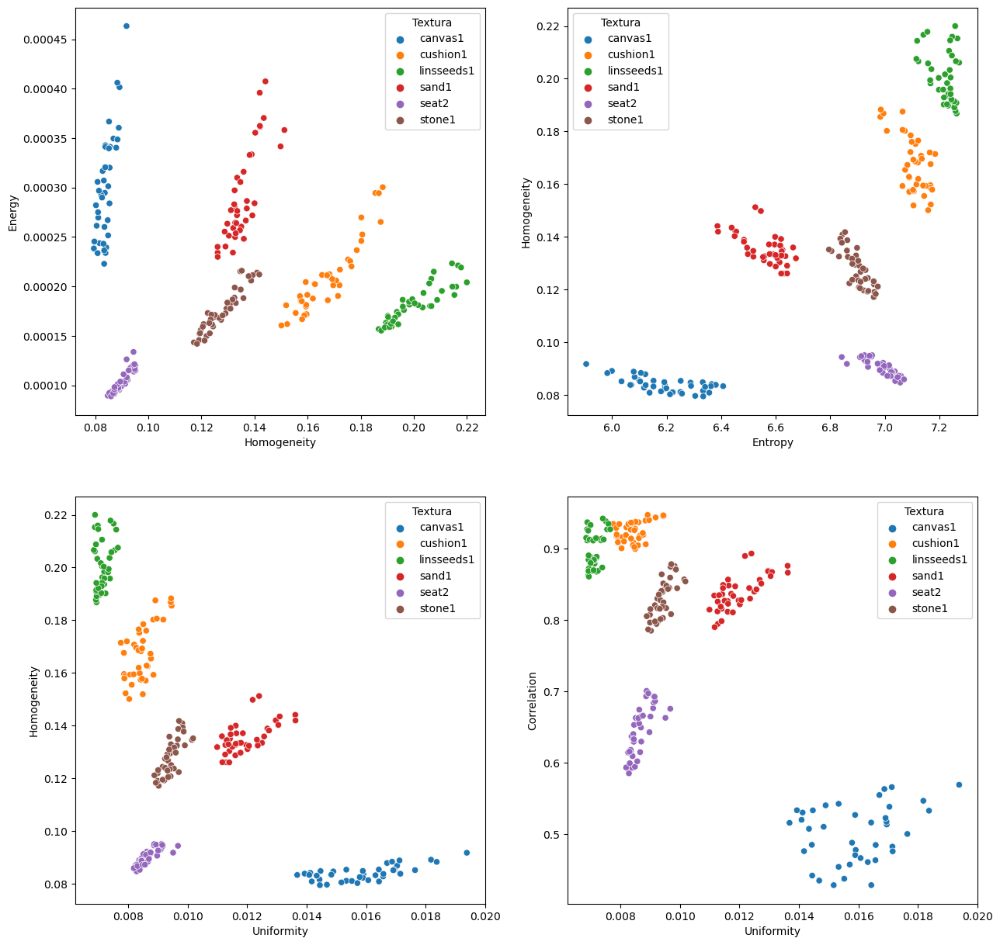

In [362]:
fig, ax = plt.subplots(2,2, figsize=(15,15))

sns.scatterplot(data= df_descriptores, x='Homogeneity', y='Energy', hue='Textura', ax=ax[0,0])
sns.scatterplot(data= df_descriptores, x='Entropy', y='Homogeneity', hue='Textura', ax=ax[0,1])
sns.scatterplot(data= df_descriptores, x='Uniformity', y='Homogeneity', hue='Textura', ax=ax[1,0])
sns.scatterplot(data= df_descriptores, x='Uniformity', y='Correlation', hue='Textura', ax=ax[1,1])

### 1.3. Implementar un clasificador de K vecinos más cercanos   
Ver:  
https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html  

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html  
  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html


a) Partir la base de imágenes en 2. De cada clase se usarán 20 imágenes para entrenamiento (conjunto de train) y se usarán las otras 20 imágenes para evaluar el clasificador (conjunto de test)        
b) Calcular sobre todas las imágenes de la base (train y test) las 2 características más relevantes (dos descriptores que se consideren buenos del paso (2) del ejercicio)   
Se armarán los arrays:    
* **X_train**:  array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de entrenamiento   
* **X_test**:  array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de test
* **y_train**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de entrenamiento
* **y_test**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de test    

c) Crear un clasificador de K vecinos más cercanos (considerar K entre 2 y 5)   
d) Entrenar con el conjunto de entrenamiento   
e) Evaluar el funcionamiento sobre el conjunto de test. 
* Mostrar la tasa de aciertos
* Mostrar la matriz de confusion de clases



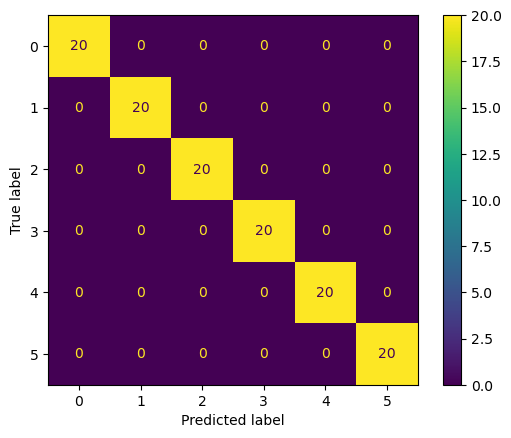

In [363]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Crea el LabelEncoder
le = LabelEncoder()

# Transforma la columna 'Textura', para que cada una sea representada por un número del 0 al 5
df_descriptores['Textura'] = le.fit_transform(df_descriptores['Textura'])

scaler = StandardScaler()

# Se decide que Uniformidad y Homogeneidad son las características más relevantes luego de analizar las gráficas del paso (2)
# Escala los datos restandole la media y dividiendo por la desviación estándar para que todas las caracteristicas tengan el mismo peso
X = scaler.fit_transform(df_descriptores[['Uniformity', 'Homogeneity']])
y = df_descriptores['Textura']

# Divide el dataframe en train y test, respetando que cada textura tenga igual representación en ambos conjuntos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42, stratify=y)

# Crea el clasificador kNN con k=3
knn = KNeighborsClassifier(n_neighbors=3)

# Entrena el clasificador
knn.fit(X_train, y_train)

# Hace predicciones sobre el test set
y_pred = knn.predict(X_test)

# Calcula la matriz de confusión
matriz_confusion = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(matriz_confusion)
disp.plot()

Las categorías corresponden a:  
0: canvas1  
1: cushion1  
2: linsseeds1  
3: sand1  
4: seat2  
5: stone1

In [364]:
accuracy = accuracy_score(y_test, y_pred)

print("Precisión: ", accuracy)

Precisión:  1.0


Se puede ver a partir de la matriz de confusión que las texturas fueron clasificadas correctamente en todos los casos. Por lo tanto, se tiene un porcentaje de acierto del 100% sobre el conjunto de prueba por lo que se puede concluir que el resultado del modelo es satisfactorio.

## 2 Detección y matching de puntos SIFT

### 2.1 Escribir un programa que dadas dos imágenes calcule puntos SIFT y realice el matching de los mismos 
**Implementar mediante funciones de OpenCV**  
Ver:   
https://docs.opencv.org/4.7.0/da/df5/tutorial_py_sift_intro.html   
https://docs.opencv.org/4.7.0/dc/dc3/tutorial_py_matcher.html   


**Explicar todos los parámetros de las funciones usadas y el criterio tomado para elegir cada uno de ellos**

In [365]:
def sift_matching(img1, img2, ratio=0.75):

    # Creación del objeto SIFT
    sift = cv2.SIFT_create()

    # Obtención de los keypoints y descriptores utilizando SIFT
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # Creación del objeto BFMatcher (Brute Force Matcher)
    bf = cv2.BFMatcher()

    # Realización del emparejamiento de los descriptores
    matches = bf.knnMatch(des1, des2, k=2)

    # Aplicación del test de ratio para seleccionar los mejores emparejamientos
    good = []
    for m, n in matches:
        if m.distance < ratio*n.distance:
            good.append([m])
    
    # Creación de un diccionario donde las claves son las coordenadas de los keypoints de la imagen de destino
    # y los valores son las coincidencias. Si un keypoint de la imagen de destino ya tiene un match,
    # entonces compara y mantiene el mejor match.
    match_dict = {}
    for match in good:
        train_idx_pt = kp2[match[0].trainIdx].pt

        # Si el keypoint de la imagen de destino ya tiene un match, compara y mantiene el mejor
        if train_idx_pt in match_dict:
            if match[0].distance < match_dict[train_idx_pt][0].distance:
                match_dict[train_idx_pt] = [match[0]]
        else:
            match_dict[train_idx_pt] = [match[0]]

    # Obtención de la lista final de mejores matches
    final_matches = list(match_dict.values())      

    # Dibujado de los emparejamientos
    img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, final_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    # Mostrado de la imagen final
    plt.figure(figsize=(12,12))
    plt.imshow(img3)
    plt.axis('Off')

cv2.SIFT_create: Esta función se utiliza para crear un objeto SIFT que luego se utilizará para calcular los keypoints y descriptores de la imagen.

detectAndCompute: Esta función de la clase SIFT se utiliza para calcular los keypoints y descriptores de la imagen. El primer argumento es la imagen y el segundo argumento es una máscara opcional que se puede utilizar para calcular los keypoints solo en una parte específica de la imagen.

cv2.BFMatcher: Este es el objeto Brute Force Matcher. Se utiliza para matchear los descriptores de las dos imágenes.

knnMatch: Esta función se utiliza para encontrar los K matches más cercanos para cada descriptor. El primer argumento son los descriptores de la primera imagen, el segundo argumento son los descriptores de la segunda imagen y el tercer argumento es K, el número de matches más cercanos que se deben encontrar.  

Se aplica el test de ratio tal como está en el tutorial de OpenCV, para eliminar matches que tienen otro match muy similar.  

Se procesan los matches para que cada punto de destino tenga un único match en el origen (el mejor).  

cv2.drawMatchesKnn: Esta función se utiliza para dibujar los matches de keypoints de las dos imágenes. Los primeros dos argumentos son las imágenes y sus keypoints respectivos, el tercer argumento son los matches y el cuarto argumento es la imagen de salida donde se dibujarán los emparejamientos, 'flags' se utiliza para determinar cómo se deben dibujar los emparejamientos, en este caso se escogió que no se dibujaran los puntos sin match.

### 2.2 Mostrar el resultado de detectar y matchear para las imágenes "peppers_dark" y "peppers_rotada"   
**a) Mostrar gráficamente los matches   
b) Para los 3 matches más fuertes, mostrarlos en las imágenes y analizar los descriptores correspondientes (escala, ángulo, histograma de orientaciones locales, etc)    
c) Algunos de los matches son erroneos (los puntos matcheados no corresponden a la misma zona de la imagen). Analizar, como en (b) alguno de estos matches erroneos.**

(-0.5, 1023.5, 511.5, -0.5)

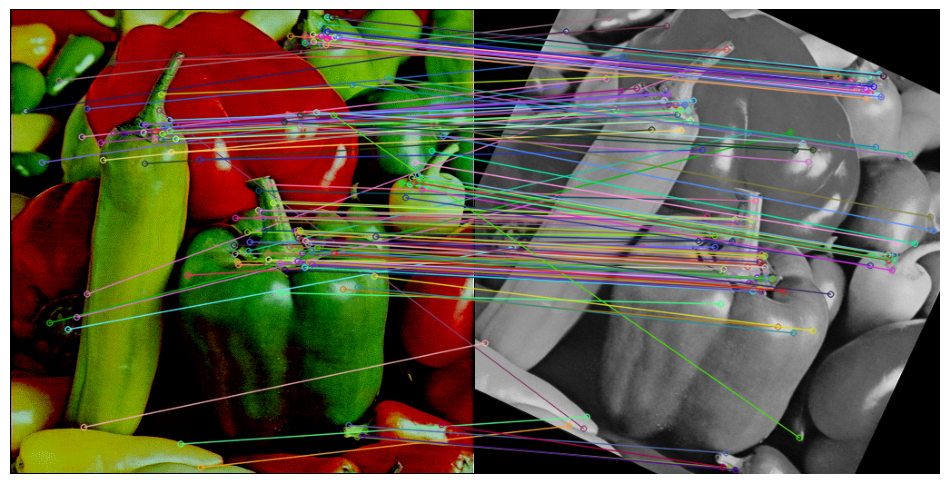

In [366]:
import cv2

peppers_dark = imread(dir_base_imagenes + '/peppers_dark.png')
peppers_rotada = imread(dir_base_imagenes + '/peppers_rotada.png')
    
#Parte a:

# Creación del objeto SIFT
sift = cv2.SIFT_create()

# Obtención de los keypoints y descriptores utilizando SIFT
kp1, des1 = sift.detectAndCompute(peppers_dark, None)
kp2, des2 = sift.detectAndCompute(peppers_rotada, None)

# Creación del objeto BFMatcher (Brute Force Matcher)
bf = cv2.BFMatcher()

# Realización del emparejamiento de los descriptores
matches = bf.knnMatch(des1, des2, k=2)

# Aplicación del test de ratio para seleccionar los mejores emparejamientos, descartando los que tienen dos matches muy cercanos
good = []
for m, n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

match_dict = {}
for match in good:
    train_idx_pt = kp2[match[0].trainIdx].pt

    # Si el keypoint de la imagen de destino ya tiene un match, compara y mantiene el mejor
    if train_idx_pt in match_dict:
        if match[0].distance < match_dict[train_idx_pt][0].distance:
            match_dict[train_idx_pt] = [match[0]]
    else:
        match_dict[train_idx_pt] = [match[0]]

# Obtención de la lista final de mejores matches
final_matches = list(match_dict.values())        

# Dibujado de los emparejamientos
I3 = cv2.drawMatchesKnn(peppers_dark, kp1, peppers_rotada, kp2, final_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrado de la imagen final
plt.figure(figsize=(12,12))
plt.imshow(I3)
plt.axis('Off')


En general, si bien hay algunos errores, el matcheo de puntos es bueno

Tres mejores matches:
Match 1:
Imagen 1 - KeyPoint 411: Ubicación (342.3191833496094, 29.35677146911621), Tamaño 4.088677406311035, Ángulo 82.813232421875
Imagen 2 - KeyPoint 527: Ubicación (429.7972412109375, 87.16716766357422), Tamaño 4.2611613273620605, Ángulo 106.34475708007812

Match 2:
Imagen 1 - KeyPoint 197: Ubicación (187.5962371826172, 478.51422119140625), Tamaño 2.455310106277466, Ángulo 109.39445495605469
Imagen 2 - KeyPoint 152: Ubicación (122.9109878540039, 448.548583984375), Tamaño 2.1328396797180176, Ángulo 137.14971923828125

Match 3:
Imagen 1 - KeyPoint 47: Ubicación (53.647789001464844, 78.56763458251953), Tamaño 3.2090885639190674, Ángulo 56.2177734375
Imagen 2 - KeyPoint 170: Ubicación (147.1352996826172, 9.542985916137695), Tamaño 3.4227569103240967, Ángulo 79.2342529296875



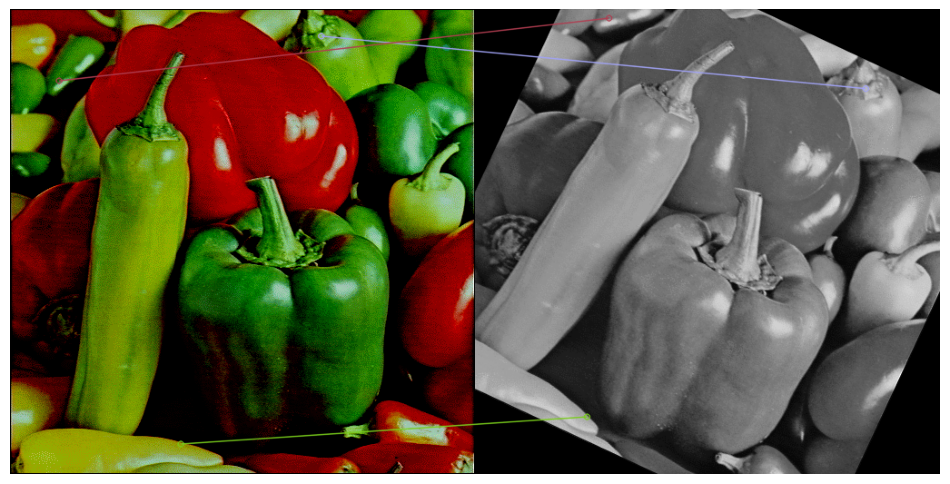

In [367]:
#Parte b:

# Selección de los tres mejores matches
final_matches = sorted(final_matches, key = lambda x: x[0].distance)
best_matches = final_matches[:3]

I3 = cv2.drawMatchesKnn(peppers_dark, kp1, peppers_rotada, kp2, best_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrado de la imagen final
plt.figure(figsize=(12,12))
plt.imshow(I3)
plt.axis('Off')

print('Tres mejores matches:')
# Análisis de los keypoints y descriptores de los mejores matches
for i, match in enumerate(best_matches):
    m = match[0]
    print(f'Match {i+1}:')
    print(f'Imagen 1 - KeyPoint {m.queryIdx}: Ubicación {kp1[m.queryIdx].pt}, Tamaño {kp1[m.queryIdx].size}, Ángulo {kp1[m.queryIdx].angle}')
    print(f'Imagen 2 - KeyPoint {m.trainIdx}: Ubicación {kp2[m.trainIdx].pt}, Tamaño {kp2[m.trainIdx].size}, Ángulo {kp2[m.trainIdx].angle}')
    print()

Se puede ver que en los tres matches el tamaño es similar, el ángulo tiene una diferencia cercana a 26°, que es lo que está girada la imagen 'peppers_rotada' con respecto a 'peppers_dark' (esto fue medido en Fiji).

Mal match:
Imagen 1 - KeyPoint 165: Ubicación (164.0966796875, 111.1566162109375), Tamaño 1.9043655395507812, Ángulo 169.662109375
Imagen 2 - KeyPoint 149: Ubicación (119.32788848876953, 461.6242980957031), Tamaño 3.820209503173828, Ángulo 289.9651184082031



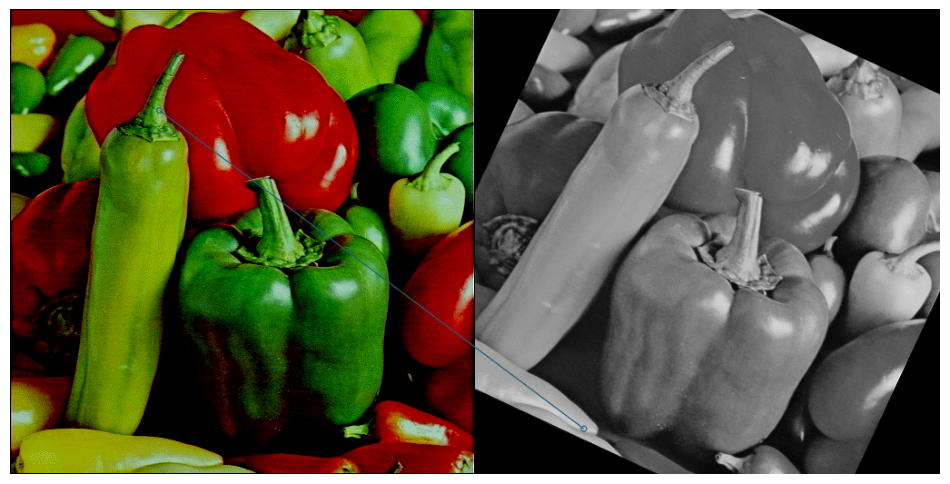

In [368]:
bad_match = final_matches[-13]

I4 = cv2.drawMatchesKnn(peppers_dark, kp1, peppers_rotada, kp2, [bad_match], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Mostrado de la imagen final
plt.figure(figsize=(12,12))
plt.imshow(I4)
plt.axis('Off')

# Análisis de los keypoints y descriptores del peor match
m = bad_match[0]
print('Mal match:')
print(f'Imagen 1 - KeyPoint {m.queryIdx}: Ubicación {kp1[m.queryIdx].pt}, Tamaño {kp1[m.queryIdx].size}, Ángulo {kp1[m.queryIdx].angle}')
print(f'Imagen 2 - KeyPoint {m.trainIdx}: Ubicación {kp2[m.trainIdx].pt}, Tamaño {kp2[m.trainIdx].size}, Ángulo {kp2[m.trainIdx].angle}')
print()

Se puede ver en las imágenes que este match es completamente erroneo. Además, por la diferencia de ángulos de los keypoint se puede deducir que no es correcto porque esta es de aproximadamente 120°, bastante lejana a 26°, que sería lo correcto. También el tamaño de los dos keypoints es muy diferente, lo cual no tiene sentido ya que las imágenes parecen estar a la misma escala, por lo que los puntos bien matcheados deberían tener el mismo tamaño.

### 2.3 Estimar, de forma robusta, la homografía entre las imágenes a partir de los matches  

A partir de la correspondencia entre puntos característicos, es posible determinar la transformación plana que relaciona las dos imágenes pero, como se vio en 2.2, no hay garantía que todas las correspondencias del matching sean buenas. Es necesario entonces estimar la homografía de forma robusta reconociendo cuáles son las correspondencias buenas (las llamaremos inliers) y descartando las malas (que llamaremos outliers).    
El cálculo robusto de la homografía se implementará mediante RANSAC.    

Para esta parte puede ser interesante ver las secciones 4.7 y 4.8 del libro:    
Multiple View Geometry in Computer Vision (Second Edition)    
Richard Hartley and Andrew Zisserman, Cambridge University Press, March 2004.    
https://www.robots.ox.ac.uk/~vgg/hzbook/



   
**Investigar RANSAC.    
Explicar la idea general de RANSAC y su aplicación para la estimación robusta de una homografía** 

La idea principal de RANSAC es que, dado un conjunto de datos con una alta proporción de outliers, al seleccionar un subconjunto mínimo de puntos de manera aleatoria, la probabilidad de seleccionar sólo inliers en algún momento, puede ser alta si se repite el proceso un número suficiente de veces.

Para la estimación de una homografía, RANSAC se utiliza de la siguiente manera:

Se selecciona un subconjunto de 4 pares de correspondencias (pares de puntos matcheados).

Se calcula la homografía que mapea estos puntos de la imagen origen a la imagen destino.

Se usa esta homografía para proyectar todos los demás puntos matcheados de la imagen de origen a la imagen de destino.

Se calcula la distancia entre las posiciones proyectadas y las posiciones reales en la imagen destino para todos los puntos. Los puntos para los que la distancia es menor que un umbral se consideran inliers de la homografía estimada.

Se repiten estos pasos un número predeterminado de veces.

Finalmente, se guarda la homografía para la cual se obtuvo el mayor número de inliers.

#### Implementar la estimación de una homografía usando RANSAC

In [369]:
def estimar_homografia_con_ransac(puntos_ori, puntos_dst, iteraciones, umbral_distancia):
    '''
    Estima una homografia usando RANSAC

    Parameters
    ----------
    puntos_ori : array Nx2 de coordenadas de puntos
        Puntos origen.
    puntos_dst : array Nx2 de coordenadas de puntos
        Puntos destino.
    iteraciones : int
        Cantidad de repeticiones del muestreo y calculo de posibles homografias.
    umbral_distancia : double
        Umbral para evaluar la distancia entre un punto destino y su 
        correspondiente proyectado por la homografia en evaluacion.

    Returns
    -------
    H : array 3x3
        Homografia estimada.
    indices_inliers : array
        Lista de los indices que resultaron inliers de H.
    indices_outliers : array
        Lista de los indices que resultaron outliers de H.

    '''
    
    # COMPLETAR
    
    # Inicializo las variables
    mejor_H = None
    mejor_inliers = []

    # Reformo los puntos a la forma (N,1,2)
    puntos_ori = np.reshape(puntos_ori, (-1, 1, 2))
    puntos_dst = np.reshape(puntos_dst, (-1, 1, 2))
    
    # Seteo la semilla
    np.random.seed(1234)

    # Itero
    for i in range(iteraciones):
        # Selecciono cuatro puntos aleatoriamente
        indices = np.random.choice(len(puntos_ori), 4, replace=False)
        pts_ori_seleccionados = puntos_ori[indices]
        pts_dst_seleccionados = puntos_dst[indices]
    
        # Calculo la homografía (fue implementado en la entrega anterior)
        H, _ = cv2.findHomography(pts_ori_seleccionados, pts_dst_seleccionados)
        
        # Proyecto los puntos de origen (fue implementado en la entrega anterior)
        puntos_proyectados = cv2.perspectiveTransform(puntos_ori, H)

        # Calculo la distancia entre los puntos proyectados y los puntos de destino
        distancias = np.sqrt(np.sum((puntos_proyectados - puntos_dst) ** 2, axis=1))

        # Obtengo los inliers
        inliers = distancias < umbral_distancia

        # Si la cantidad de inliers es mayor a la mejor cantidad de inliers hasta ahora, actualizo la mejor homografía
        if np.sum(inliers) > len(mejor_inliers):
            mejor_H = H
            mejor_inliers = inliers

    # Obtener los outliers
    indices_inliers = np.where(mejor_inliers)[0]
    indices_outliers = np.where(~mejor_inliers)[0]
    
    H = mejor_H
    
    return H, indices_inliers, indices_outliers

#### Estimar la homografía para las correspondencias encontradas entre las imágenes "peppers_dark" y "peppers_rotada"   
**a) Mostrar los resultados numéricos (H,cantidad de inliers y outliers, etc.)   
b) Mostrar gráficamente las correspondencias inliers y outliers** 

In [370]:
#a)
origen = np.array([kp1[m[0].queryIdx].pt for m in final_matches])
destino = np.array([kp2[m[0].trainIdx].pt for m in final_matches])

H, inliers, outliers = estimar_homografia_con_ransac(origen, destino, 100000, 4)

print(H)
print('Cantidad de inliers: ' + str(len(inliers)))
print('Cantidad de outliers: ' + str(len(outliers)))

[[ 9.42304648e-01 -4.30929205e-01  1.29020589e+02]
 [ 4.38146904e-01  9.33656206e-01 -8.92217572e+01]
 [ 5.84409055e-05 -4.29787970e-06  1.00000000e+00]]
Cantidad de inliers: 235
Cantidad de outliers: 31


Text(0.5, 1.0, 'Outliers')

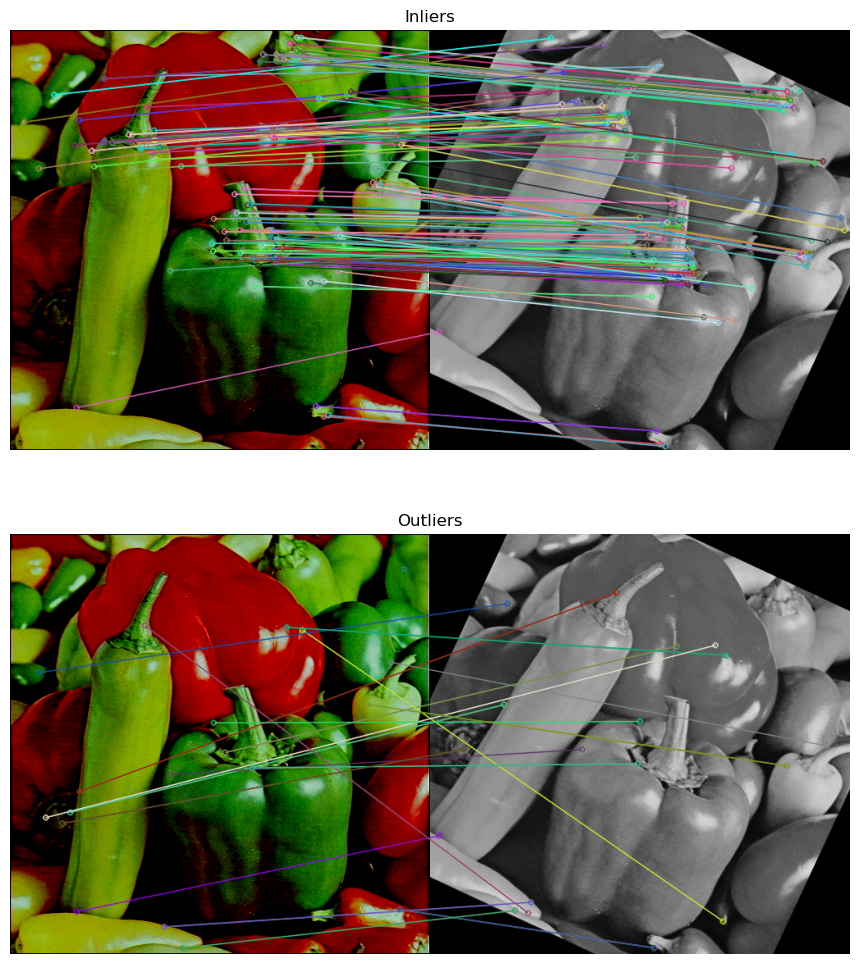

In [371]:
#b)

# Obtener los matches de inliers y outliers
matches_inliers = [final_matches[i] for i in inliers]
matches_outliers = [final_matches[i] for i in outliers]

# Dibujar los inliers
img_inliers = cv2.drawMatchesKnn(peppers_dark, kp1, peppers_rotada, kp2, matches_inliers, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Dibujar los outliers
img_outliers = cv2.drawMatchesKnn(peppers_dark, kp1, peppers_rotada, kp2, matches_outliers, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig,ax = plt.subplots(2,1, figsize=(24,12))
ax[0].imshow(img_inliers)
ax[0].axis('Off')
ax[0].set_title('Inliers')
ax[1].imshow(img_outliers)
ax[1].axis('Off')
ax[1].set_title('Outliers')

Se puede observar en la imagen de los inliers que todos son matcheos correctos.  
En la imagen de los outliers, si bien hay varios matcheos que no son el mismo punto pero son puntos cercanos, otros son puntos completamente distintos de la imagen.  
Como comentario, uno de los puntos dentro de los 3 matches más fuertes es un outlier.

Text(0.5, 1.0, 'peppers_rotada')

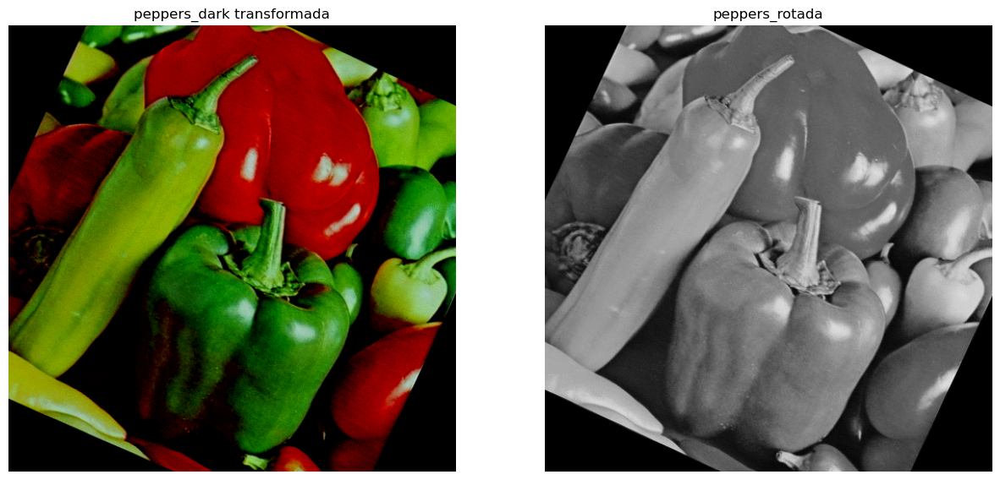

In [372]:
# Aplicar la homografía a la imagen original
peppers_out = cv2.warpPerspective(peppers_dark, H, (peppers_dark.shape[1], peppers_dark.shape[0]))

fig, ax = plt.subplots(1,2, figsize=(15,15))
ax[0].imshow(peppers_out, cmap='gray')
ax[0].axis('Off')
ax[0].set_title('peppers_dark transformada')
ax[1].imshow(peppers_rotada, cmap='gray')
ax[1].axis('Off')
ax[1].set_title('peppers_rotada')

Al aplicar la homografía hallada a la imagen original se puede ver que si bien no es exactamente la misma que la imagen rotada, se acerca bastante. Probablemente se podría obtener un mejor resultado aumentando el número de iteraciones y disminuyendo el umbral en RANSAC.

### 2.4 Aplicación: Reconocimiento automático de productos de supermercado

El objetivo es reconocer automáticamente y encontrar la orientación en la imagen de productos de supermercado cuando éstos son mostrados a la cámara utilizando matching de puntos SIFT.   

**Imágenes base**  
Obtener las imágenes de productos en páginas web de supermercados.  Se usarán 4 imágenes base de productos que a su vez tengan en su casa.  

**Imágenes a reconocer**   
Se adquirirán 6 imágenes de cada uno de los productos reales con variación de distancia, orientación y posición.  Se adquirirán además 6 imágenes sin ningún producto.     

A modo de ejemplo se incluyen dos imágenes base de productos e imágenes a reconocer (ver imagenes/productos).


**Se implementará un programa que**, dada una imagen a reconocer:

a) Determine si está presente o no alguno de los productos de las imágenes base  
b) En caso de haber un producto presente en la imágen se debe   
* indicar cuál es el producto 
* estimar la homografía entre producto base y producto real
* mostrar, sobre la imagen a reconocer, el recuadro del producto calculado usando la homografía




In [373]:
def dibujar_recuadro(imagen, homografia, imagen_base):
    # Altura y anchura de la imagen base
    alto, ancho = imagen_base.shape[:2]

    # Esquinas de la imagen base
    esquinas = np.array([[0, 0], [ancho, 0], [ancho, alto], [0, alto]], dtype='float32')

    # Pasar a coordenadas homogeneas para la función cv2.perspectiveTransform
    esquinas = np.expand_dims(esquinas, axis=0)

    # Transformar las esquinas utilizando la homografía
    esquinas_transformadas = cv2.perspectiveTransform(esquinas, homografia)

    # Dibujar el recuadro en la imagen a reconocer
    cv2.polylines(imagen, [np.int32(esquinas_transformadas)], True, (0, 255, 0), 10)

    return imagen

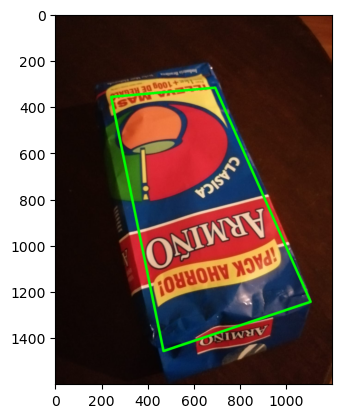

In [374]:
#Prueba:

IB1 = imread(dir_base_imagenes+'/productos/imagenes_base/yerba.jpg')

IR1_1 = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/yerba_2.jpeg')

# Extracción de características de la imagen base
kp_imagen_base, des_imagen_base = sift.detectAndCompute(IB1, None)

# Extracción de características de la imagen a reconocer
kp_imagen_a_reconocer, des_imagen_a_reconocer = sift.detectAndCompute(IR1_1, None)

# Inicialización del matcher de características
bf = cv2.BFMatcher()

# Encuentro las coincidencias entre la imagen a reconocer y la imagen base
matches = bf.knnMatch(des_imagen_base, des_imagen_a_reconocer, k=2)

# Aplicación del test de ratio de Lowe para filtrar las buenas coincidencias
buenos_matches = []
for m, n in matches:
    if m.distance < 0.75*n.distance:
        buenos_matches.append([m])
        
match_dict = {}
for match in buenos_matches:
    train_idx_pt = kp_imagen_a_reconocer[match[0].trainIdx].pt

    # Si el keypoint de la imagen de destino ya tiene un match, compara y mantiene el mejor
    if train_idx_pt in match_dict:
        if match[0].distance < match_dict[train_idx_pt][0].distance:
            match_dict[train_idx_pt] = [match[0]]
    else:
        match_dict[train_idx_pt] = [match[0]]

# Obtención de la lista final de mejores matches
matches_finales = list(match_dict.values())     
        
# Hallo los puntos de origen y destino
puntos_origen = np.array([kp_imagen_base[m[0].queryIdx].pt for m in matches_finales])
puntos_destino = np.array([kp_imagen_a_reconocer[m[0].trainIdx].pt for m in matches_finales])

# Cálculo de la homografía usando RANSAC
homografia, inliers, outliers = estimar_homografia_con_ransac(puntos_origen, puntos_destino, 10000, 3)

imagen_recuadro = dibujar_recuadro(IR1_1.copy(), homografia, IB1)

plt.imshow(imagen_recuadro)



Text(0.5, 1.0, 'Outliers')

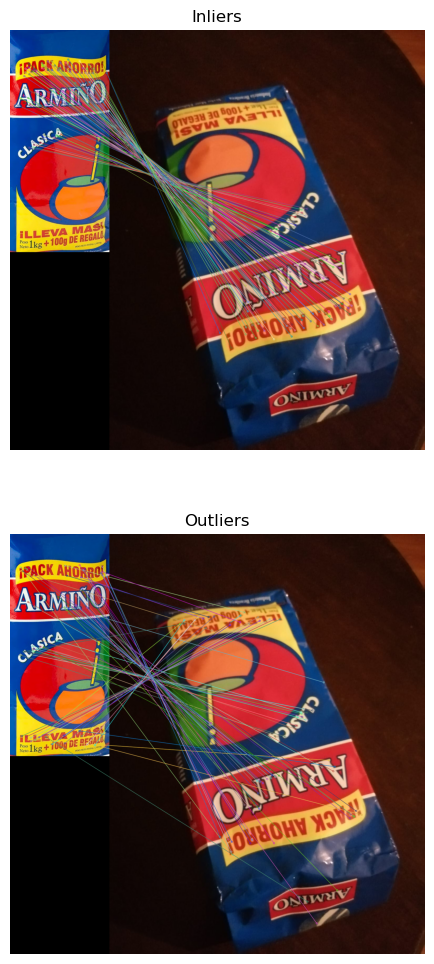

In [375]:
# Obtener los matches de inliers y outliers
matches_inliers = [matches_finales[i] for i in inliers]
matches_outliers = [matches_finales[i] for i in outliers]

# Dibujar los inliers
img_inliers = cv2.drawMatchesKnn(IB1, kp_imagen_base, IR1_1,kp_imagen_a_reconocer, matches_inliers, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Dibujar los outliers
img_outliers = cv2.drawMatchesKnn(IB1, kp_imagen_base, IR1_1,kp_imagen_a_reconocer, matches_outliers, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig,ax = plt.subplots(2,1, figsize=(24,12))
ax[0].imshow(img_inliers)
ax[0].axis('Off')
ax[0].set_title('Inliers')
ax[1].imshow(img_outliers)
ax[1].axis('Off')
ax[1].set_title('Outliers')

In [376]:
imagenes_base = {
    "Café Melitta": imread(dir_base_imagenes+'/productos/imagenes_base/cafe_melitta.jpg'),
    "Yerba Armiño": imread(dir_base_imagenes+'/productos/imagenes_base/yerba.jpg'),
    "Pulpa De Ley": imread(dir_base_imagenes+'/productos/imagenes_base/pulpa.jpg'),
    "Galletas La Trigueña": imread(dir_base_imagenes+'/productos/imagenes_base/galletas.jpg'),
    "Pasta Colgate": imread(dir_base_imagenes+'/productos/imagenes_base/pasta.jpg'),
    "Chocolate Nestlé": imread(dir_base_imagenes+'/productos/imagenes_base/chocolate.jpg'),
    "Espirales Saturno": imread(dir_base_imagenes+'/productos/imagenes_base/espirales.jpeg'),
    "Cereales Vitalisimo": imread(dir_base_imagenes+'/productos/imagenes_base/cereales.jpg'),
}

def reconocer_producto(imagen_a_reconocer, imagenes_base, umbral_inliers):
    # Creación del extractor SIFT
    sift = cv2.SIFT_create()

    # Extracción de características de la imagen a reconocer
    kp_imagen_a_reconocer, des_imagen_a_reconocer = sift.detectAndCompute(imagen_a_reconocer, None)

    # Inicialización del matcher de características
    bf = cv2.BFMatcher()

    max_inliers = 0
    homografia_mejor = None
    producto_mejor = None

    for producto, imagen_base in imagenes_base.items():
        # Extracción de características de la imagen base
        kp_imagen_base, des_imagen_base = sift.detectAndCompute(imagen_base, None)

        # Encuentro las coincidencias entre la imagen a reconocer y la imagen base
        matches = bf.knnMatch(des_imagen_base, des_imagen_a_reconocer, k=2)

        # Aplicación del test de ratio de Lowe para filtrar las buenas coincidencias
        buenos_matches = []
        for m, n in matches:
            if m.distance < 0.75*n.distance:
                buenos_matches.append([m])
                
        # Creación de un diccionario donde las claves son las coordenadas de los keypoints de la imagen de destino
        # y los valores son las coincidencias. Si un keypoint de la imagen de destino ya tiene un match,
        # entonces compara y mantiene el mejor match.
        match_dict = {}
        for match in buenos_matches:
            train_idx_pt = kp_imagen_a_reconocer[match[0].trainIdx].pt

            # Si el keypoint de la imagen de destino ya tiene un match, compara y mantiene el mejor
            if train_idx_pt in match_dict:
                if match[0].distance < match_dict[train_idx_pt][0].distance:
                    match_dict[train_idx_pt] = [match[0]]
            else:
                match_dict[train_idx_pt] = [match[0]]

        # Obtención de la lista final de mejores matches
        matches_finales = list(match_dict.values())     

        if len(matches_finales) >= 4:
        
            # Hallo los puntos de origen y destino
            puntos_origen = np.array([kp_imagen_base[m[0].queryIdx].pt for m in matches_finales])
            puntos_destino = np.array([kp_imagen_a_reconocer[m[0].trainIdx].pt for m in matches_finales])
                        
            # Cálculo de la homografía usando RANSAC
            homografia, inliers, outliers = estimar_homografia_con_ransac(puntos_origen, puntos_destino, 1000, 3)

            # Si la cantidad de inliers es mayor que el máximo actual, actualizar el máximo y guardar la homografía
            if len(inliers) > max_inliers:
                max_inliers = len(inliers)
                homografia_mejor = homografia
                producto_mejor = producto
                
    # Si el número máximo de inliers es menor que el umbral, entonces no hay ningún producto en la imagen
    if max_inliers < umbral_inliers:
        print("No se detectó ningún producto en la imagen.")
    else:
        # Dibujar el recuadro del producto en la imagen a reconocer usando la mejor homografía
        imagen_recuadro = dibujar_recuadro(imagen_a_reconocer.copy(), homografia_mejor, imagenes_base[producto_mejor])
        
        plt.figure()
        plt.imshow(imagen_recuadro)
        plt.axis('Off')
        plt.title('Producto: ' + producto_mejor)

**Se muestran a continuación ejemplos de productos bien detectados:**  
(variar el número del 1 al 6 para ver los demás ejemplos de cada producto)

In [377]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/nada_6.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

No se detectó ningún producto en la imagen.


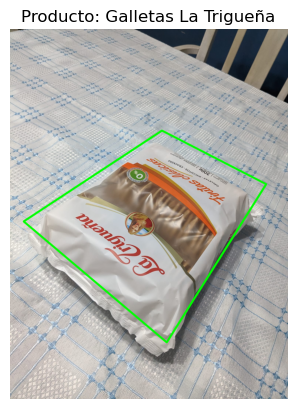

In [378]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/galletas_5.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

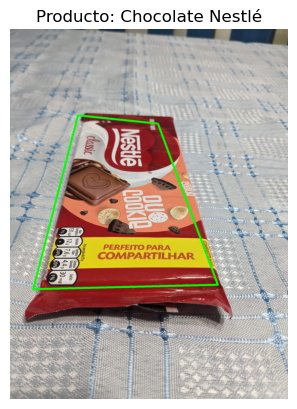

In [379]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/chocolate_3.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

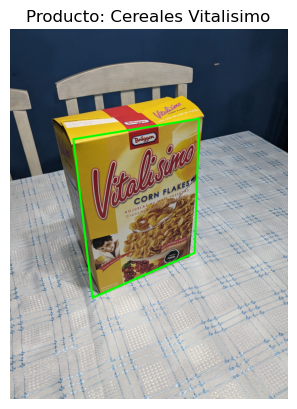

In [380]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/cereales_1.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

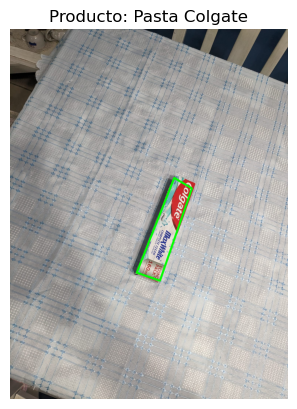

In [381]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/pasta_2.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

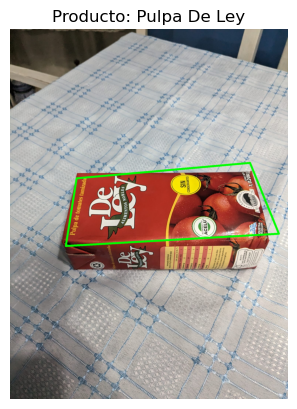

In [382]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/pulpa_5.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

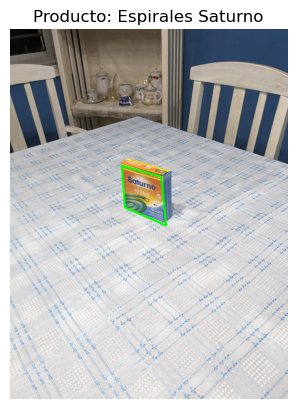

In [383]:
I_a_reconocer = imread(dir_base_imagenes+'/productos/imagenes_a_reconocer/espirales_4.jpeg')

reconocer_producto(I_a_reconocer, imagenes_base, 15)

El resultado de la función es satisfactorio. En todos los casos que no hay ningún producto no detecta nada (esto es por el umbral ingresado en la función), mientras que en las fotos que hay un producto, detecta correctamente el mismo y dibuja el rectángulo correctamente en la mayoría de los casos. Falla en 1 o 2 fotos por producto, no detectandolo, y es en los casos que la foto está tomada con mayor ángulo.  
Se podrían mejorar los resultados aumentando el número de iteraciones en la estimación de la homografía con RANSAC.